## Random forest classifier

Accuracy: 0.8673644474948524


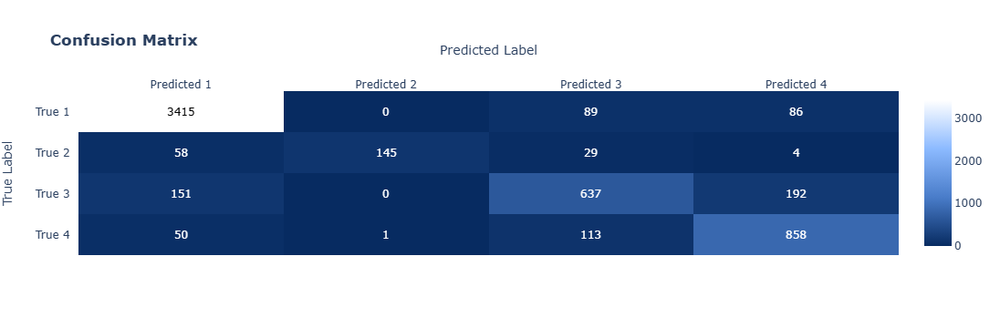

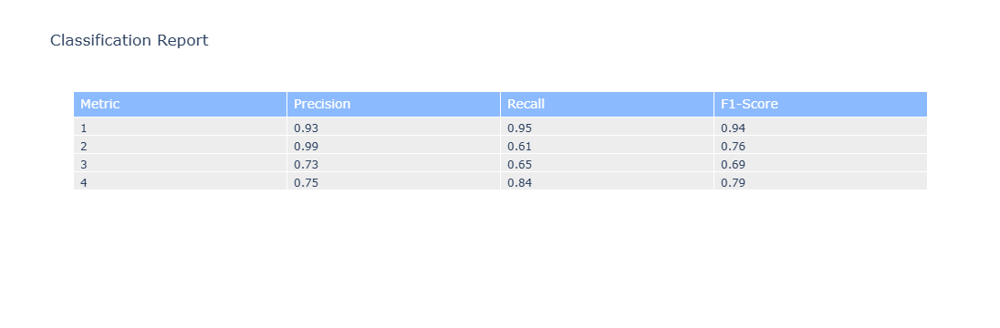

In [11]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
import plotly.figure_factory as ff
import plotly.graph_objects as go

df = pd.read_csv('selected_features_ANOVA_8.csv')
variables_to_keep = df[['NUM_ACC', 'NUM_ROU', 'PKM', 'COD_PRV','id_vehicule']]
X = df.drop(['CLASSE_ISR', 'NUM_ACC', 'NUM_ROU', 'PKM', 'COD_PRV','id_vehicule'], axis=1)
y = df['CLASSE_ISR']
X_train, X_test, y_train, y_test, vars_train, vars_test = train_test_split(X, y, variables_to_keep, test_size=0.25, random_state=42)
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)
rf_classifier = RandomForestClassifier(n_estimators=100, random_state=42)
rf_classifier.fit(X_train_scaled, y_train)
y_pred = rf_classifier.predict(X_test_scaled)
accuracy = accuracy_score(y_test, y_pred)
print("Accuracy:", accuracy)
X_test_with_predictions = X_test.copy()
X_test_with_predictions['Predicted_CLASSE_ISR'] = y_pred
X_test_with_predictions = X_test_with_predictions.reset_index(drop=True)
vars_test = vars_test.reset_index(drop=True)
X_test_with_predictions = pd.concat([X_test_with_predictions, vars_test], axis=1)
X_test_with_predictions.to_csv('RFC_CLASSISR_2205.csv', index=False)
conf_matrix = confusion_matrix(y_test, y_pred)
class_labels = sorted(set(y_test) | set(y_pred))

colors = ['#072b61', '#497cc9', '#8cbaff', '#ffffff']
colorscale = [[i / (len(colors) - 1), colors[i]] for i in range(len(colors))]

fig_cm = ff.create_annotated_heatmap(
    z=conf_matrix,
    colorscale=colorscale,
    x=[f'Predicted {label}' for label in class_labels],
    y=[f'True {label}' for label in class_labels],
    annotation_text=conf_matrix,
    showscale=True
)

fig_cm.update_layout(
    title_text='<b>Confusion Matrix</b>',
    xaxis_title='Predicted Label',
    yaxis_title='True Label',
    yaxis_autorange='reversed'
)

fig_cm.show()

# Classification Report
report = classification_report(y_test, y_pred, target_names=list(map(str, class_labels)), output_dict=True)
df_report = pd.DataFrame(report).transpose().round(2)
df_report = df_report.drop('support', axis=1)
df_report = df_report.loc[list(map(str, class_labels))]

fig = go.Figure(data=[go.Table(
    header=dict(values=['Metric', 'Precision', 'Recall', 'F1-Score'],
                fill_color='#8cbaff',
                font=dict(color='white', size=14),
                align='left'),
    cells=dict(values=[df_report.index, df_report['precision'], df_report['recall'], df_report['f1-score']],
               fill_color='#ededed',
               align='left'))
])

fig.update_layout(title_text='Classification Report')
fig.show()
fig.write_image("RF_REPPORT.png", scale=2) 

### Saving the model

In [1]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
import plotly.figure_factory as ff
import plotly.graph_objects as go
import joblib

df = pd.read_csv('selected_features_ANOVA_8.csv')
variables_to_keep = df[['NUM_ACC', 'NUM_ROU', 'PKM', 'COD_PRV', 'id_vehicule']]
X = df.drop(['CLASSE_ISR', 'NUM_ACC', 'NUM_ROU', 'PKM', 'COD_PRV', 'id_vehicule'], axis=1)
y = df['CLASSE_ISR']
X_train, X_test, y_train, y_test, vars_train, vars_test = train_test_split(X, y, variables_to_keep, test_size=0.25, random_state=42)

scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)
rf_classifier = RandomForestClassifier(n_estimators=100, random_state=42)
rf_classifier.fit(X_train_scaled, y_train)
y_pred = rf_classifier.predict(X_test_scaled)

accuracy = accuracy_score(y_test, y_pred)
print("Accuracy:", accuracy)
X_test_with_predictions = X_test.copy()
X_test_with_predictions['Predicted_CLASSE_ISR'] = y_pred
X_test_with_predictions = X_test_with_predictions.reset_index(drop=True)
vars_test = vars_test.reset_index(drop=True)
X_test_with_predictions = pd.concat([X_test_with_predictions, vars_test], axis=1)
X_test_with_predictions.to_csv('RFC_CLASSISR_2205.csv', index=False)
model_filename = 'rf_classifier_model.joblib'
scaler_filename = 'rf_scaler.joblib'

joblib.dump(rf_classifier, model_filename)
joblib.dump(scaler, scaler_filename)

print(f"Model saved as {model_filename}")
print(f"Scaler saved as {scaler_filename}")


Accuracy: 0.8673644474948524
Model saved as rf_classifier_model.joblib
Scaler saved as rf_scaler.joblib


In [35]:
X_test_with_predictions

,Victimes,TMJA_en_veh_j,COD_TYP_CHA,SIG_HOR,SIG_VER,COD_TYP_COL,AGE_CON,COD_TRA,age_veh,route_class,...,HEU_ACC,MOIS_ACC,COD_PRF_CON,COD_USA_VEH,Predicted_CLASSE_ISR,NUM_ACC,NUM_ROU,PKM,COD_PRV,id_vehicule
0,303,12383,1,1,1,5,37,9,8,1,...,8,12,6,0,1,44639,1,461,10,1918220
1,314,25745,1,1,1,3,48,0,12,1,...,18,12,6,9,1,46026,9,33,50,1946341
2,93,11361,1,1,1,2,30,4,8,1,...,21,10,8,0,1,38285,1,398,54,1893639
3,8,235,1,2,2,8,19,0,3,3,...,18,6,6,0,4,20274,3100,32,4,1804459
4,37,2620,1,1,1,8,52,9,35,1,...,12,12,9,0,1,45262,8,289,57,1942416
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5823,25,10399,2,2,2,7,45,0,12,3,...,9,8,6,0,3,29579,6000,8,47,1928821
5824,299,33103,1,1,1,3,39,9,13,2,...,15,7,6,9,1,24531,315,10,50,1833929
5825,12,2093,1,1,1,8,49,3,22,1,...,21,6,9,3,4,21549,2,452,24,1807413
5826,3,15694,1,1,1,2,37,3,14,1,...,20,4,6,0,4,13091,2,464,24,1809194


###  Training ^ testing dataset illustration

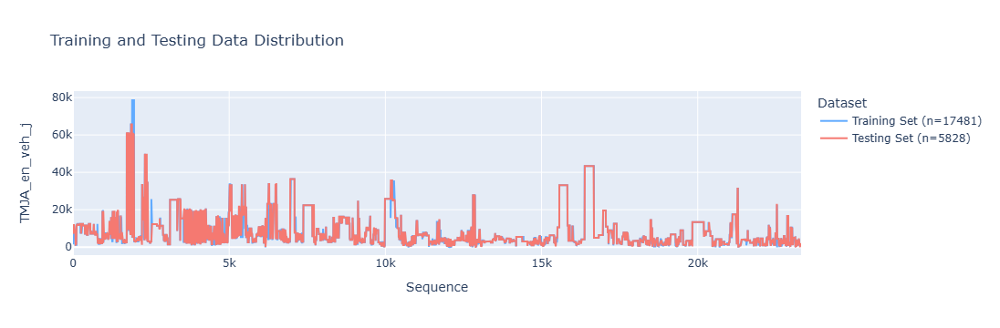

In [5]:
import pandas as pd
import plotly.graph_objects as go
from sklearn.model_selection import train_test_split

feature = 'TMJA_en_veh_j'
X = df[[feature]]
y = df['CLASSE_ISR']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state=42)
X_train.loc[:, 'Set'] = 'Training'
X_test.loc[:, 'Set'] = 'Testing'
combined = pd.concat([X_train, X_test]).sort_index()
combined['Sequence'] = range(len(combined))
fig = go.Figure()
fig.add_trace(go.Scatter(
    x=combined[combined['Set'] == 'Training']['Sequence'],
    y=combined[combined['Set'] == 'Training'][feature],
    mode='lines',
    name=f'Training Set (n={len(y_train)})',
    line=dict(color='#61abff', width=2)
))
fig.add_trace(go.Scatter(
    x=combined[combined['Set'] == 'Testing']['Sequence'],
    y=combined[combined['Set'] == 'Testing'][feature],
    mode='lines',
    name=f'Testing Set (n={len(y_test)})',
    line=dict(color='#f57971', width=2)
))
fig.update_layout(
    title='Training and Testing Data Distribution',
    xaxis_title='Sequence',
    yaxis_title=feature,
    legend_title='Dataset'
)
fig.show()
fig.write_image("testtrain.png", scale=2) 


### Example of desicion treeused in this algorithm

Accuracy: 0.6


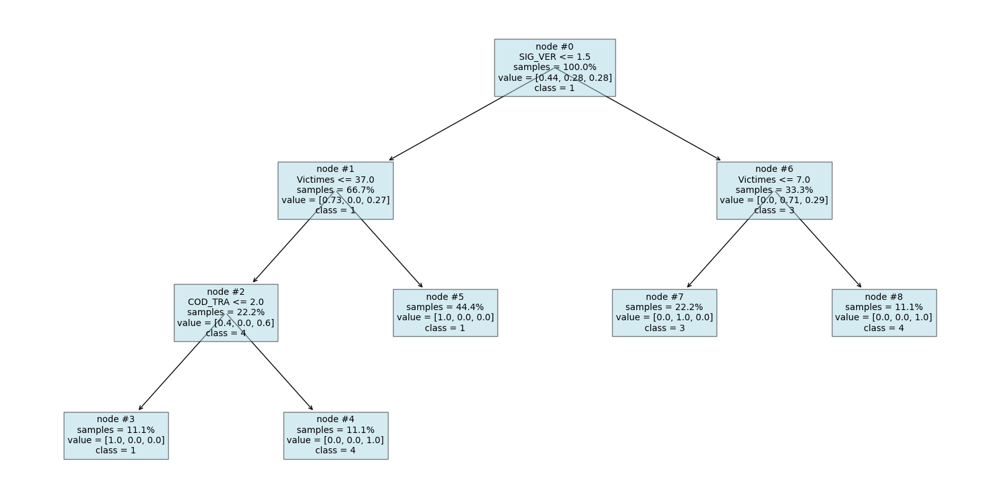

In [57]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score
import matplotlib.pyplot as plt
from sklearn.tree import plot_tree
import numpy as np

df = pd.read_csv('selected_features_ANOVA_8.csv')

variables_to_keep = df[['NUM_ACC', 'NUM_ROU', 'PKM', 'COD_PRV', 'id_vehicule']]
X = df.drop(['CLASSE_ISR', 'NUM_ACC', 'NUM_ROU', 'PKM', 'COD_PRV', 'id_vehicule'], axis=1)
y = df['CLASSE_ISR']
sample_size = int(0.001 * len(df))
X_sample = X.sample(n=sample_size, random_state=42)
y_sample = y.loc[X_sample.index]
vars_sample = variables_to_keep.loc[X_sample.index]
X_train, X_test, y_train, y_test, vars_train, vars_test = train_test_split(
    X_sample, y_sample, vars_sample, test_size=0.2, random_state=42
)
rf_classifier = RandomForestClassifier(n_estimators=100, random_state=42)
rf_classifier.fit(X_train, y_train)
y_pred = rf_classifier.predict(X_test)
accuracy = accuracy_score(y_test, y_pred)
print("Accuracy:", accuracy)
tree = rf_classifier.estimators_[0]
plt.figure(figsize=(20, 10))
plot_tree(tree, feature_names=X.columns, class_names=[str(c) for c in rf_classifier.classes_], 
          filled=True, rounded=True, impurity=False, proportion=True, 
          label='all', precision=2, fontsize=10, node_ids=True, max_depth=None)
ax = plt.gca()
for node in ax.get_children():
    if isinstance(node, plt.Text):
        node.set_bbox(dict(facecolor='lightblue', edgecolor='black', alpha=0.5)) 
plt.savefig('decision_tree_blue.png', dpi=300)
plt.show()



In [13]:
X_test_with_predictions

,Victimes,TMJA_en_veh_j,COD_ETA_CHA,COD_TYP_CHA,POS_ACO_DRO,POS_ACO_GAU,SIG_HOR,SIG_VER,COD_TYP_COL,AGE_CON,...,COD_FAU_NON_CON,age_veh,route_class,Type_veh,id_vehicule,Predicted_CLASSE_ISR,NUM_ACC,NUM_ROU,PKM,COD_PRV
0,303,12383,1,1,1,1,1,1,5,37,...,9,8,1,1,1918220,1,44639,1,461,10
1,314,25745,1,1,1,1,1,1,3,48,...,9,12,1,0,1946341,1,46026,9,33,50
2,93,11361,1,1,1,1,1,1,2,30,...,9,8,1,1,1893639,1,38285,1,398,54
3,8,235,1,1,1,1,2,2,8,19,...,9,3,3,1,1804459,4,20274,3100,32,4
4,37,2620,1,1,1,1,1,1,8,52,...,9,35,1,3,1942416,3,45262,8,289,57
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4657,7,18946,1,1,1,1,1,1,8,34,...,9,2,1,3,1950625,3,46222,1,115,40
4658,297,16325,1,1,1,1,1,1,2,30,...,9,4,1,3,1874706,1,25959,8,236,22
4659,48,2873,1,1,1,1,1,2,2,45,...,9,6,2,3,1928762,1,28486,201,134,58
4660,16,1913,1,1,1,1,2,2,7,34,...,9,7,3,3,1930661,3,41028,5002,42,66


## KNN

Accuracy: 0.7917202917202917


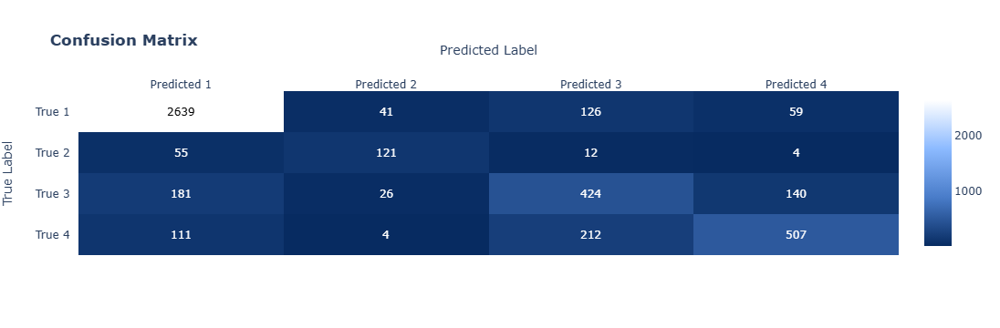

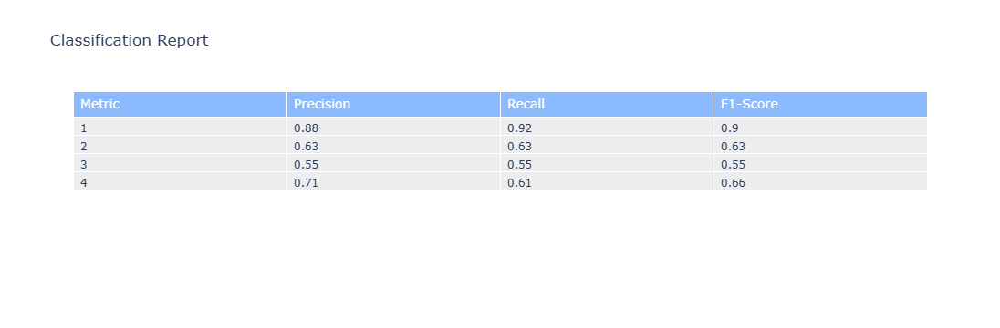

In [17]:
import pandas as pd
import plotly.figure_factory as ff
from sklearn.model_selection import train_test_split
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
import plotly.graph_objects as go

df = pd.read_csv('selected_features_ANOVA_8.csv')
variables_to_keep = df[['NUM_ACC', 'NUM_ROU', 'PKM', 'COD_PRV','id_vehicule']]
X = df.drop(['CLASSE_ISR', 'NUM_ACC', 'NUM_ROU', 'PKM', 'COD_PRV','id_vehicule'], axis=1)
y = df['CLASSE_ISR']
X_train, X_test, y_train, y_test, vars_train, vars_test = train_test_split(X, y, variables_to_keep, test_size=0.2, random_state=42)

knn = KNeighborsClassifier(n_neighbors=5)
knn.fit(X_train, y_train)
y_pred = knn.predict(X_test)

X_test_with_predictions = X_test.copy()
X_test_with_predictions['Predicted_CLASSE_ISR'] = y_pred
X_test_with_predictions.to_csv('KNN_CLASSISR_2105.csv', index=False)

accuracy = accuracy_score(y_test, y_pred)
print("Accuracy:", accuracy)

conf_matrix = confusion_matrix(y_test, y_pred)
class_labels = sorted(set(y_test) | set(y_pred))

colors = ['#072b61', '#497cc9', '#8cbaff', '#ffffff']
colorscale = [[i / (len(colors) - 1), colors[i]] for i in range(len(colors))]

fig_cm = ff.create_annotated_heatmap(
    z=conf_matrix,
    colorscale=colorscale,
    x=[f'Predicted {label}' for label in class_labels],
    y=[f'True {label}' for label in class_labels],
    annotation_text=conf_matrix,
    showscale=True
)

fig_cm.update_layout(
    title_text='<b>Confusion Matrix</b>',
    xaxis_title='Predicted Label',
    yaxis_title='True Label',
    yaxis_autorange='reversed'
)

fig_cm.show()

report = classification_report(y_test, y_pred, target_names=list(map(str, class_labels)), output_dict=True)
df_report = pd.DataFrame(report).transpose().round(2)
df_report = df_report.drop('support', axis=1)
df_report = df_report.loc[list(map(str, class_labels))]

fig = go.Figure(data=[go.Table(
    header=dict(values=['Metric', 'Precision', 'Recall', 'F1-Score'],
                fill_color='#8cbaff',
                font=dict(color='white', size=14),
                align='left'),
    cells=dict(values=[df_report.index, df_report['precision'], df_report['recall'], df_report['f1-score']],
               fill_color='#ededed',
               align='left'))
])

fig.update_layout(title_text='Classification Report')
fig_cm.write_image("KNN_REPPORT.png", scale=2) 
fig.show()

## ANN

Epoch 1/60
525/525 ━━━━━━━━━━━━━━━━━━━━ 10s 8ms/step - accuracy: 0.6478 - loss: 0.9038 - val_accuracy: 0.6987 - val_loss: 0.6392
Epoch 2/60
525/525 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - accuracy: 0.7135 - loss: 0.6146 - val_accuracy: 0.7169 - val_loss: 0.6002
Epoch 3/60
525/525 ━━━━━━━━━━━━━━━━━━━━ 4s 4ms/step - accuracy: 0.7279 - loss: 0.5827 - val_accuracy: 0.7271 - val_loss: 0.5765
Epoch 4/60
525/525 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - accuracy: 0.7295 - loss: 0.5706 - val_accuracy: 0.7324 - val_loss: 0.5814
Epoch 5/60
525/525 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - accuracy: 0.7332 - loss: 0.5672 - val_accuracy: 0.7153 - val_loss: 0.5777
Epoch 6/60
525/525 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - accuracy: 0.7420 - loss: 0.5486 - val_accuracy: 0.7271 - val_loss: 0.5801
Epoch 7/60
525/525 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - accuracy: 0.7470 - loss: 0.5455 - val_accuracy: 0.7405 - val_loss: 0.5613
Epoch 8/60
525/525 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - accuracy: 0.7561 - loss: 0.5325 - val_accuracy: 0

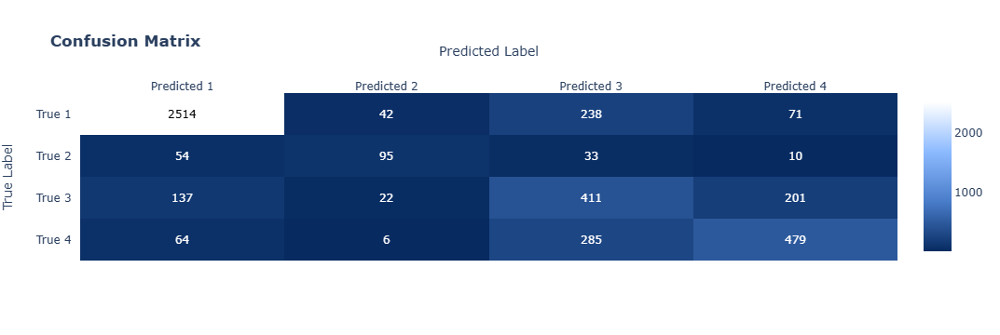

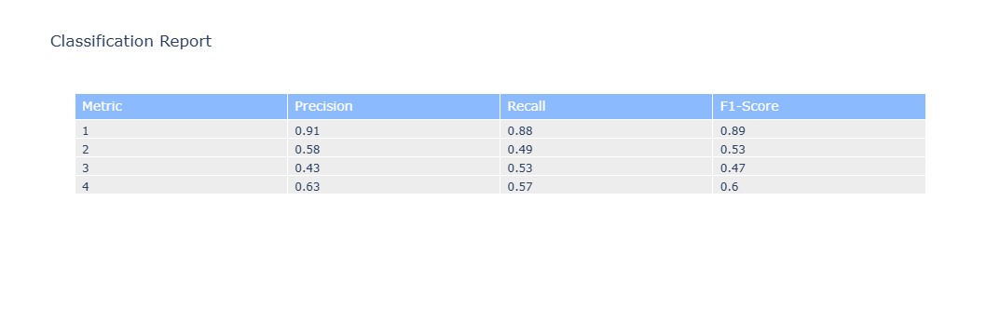

In [15]:
import pandas as pd
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Input
from sklearn.model_selection import train_test_split
from tensorflow.keras.utils import to_categorical
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
from sklearn.preprocessing import StandardScaler
import plotly.figure_factory as ff
import plotly.graph_objects as go
import numpy as np

df = pd.read_csv('selected_features_ANOVA_8.csv')
variables_to_keep = df[['NUM_ACC', 'NUM_ROU', 'PKM', 'COD_PRV', 'id_vehicule']]
X = df.drop(['CLASSE_ISR', 'NUM_ACC', 'NUM_ROU', 'PKM', 'COD_PRV', 'id_vehicule'], axis=1)
y = df['CLASSE_ISR']
y_encoded = to_categorical(y)
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)
X_train, X_test, y_train, y_test = train_test_split(X_scaled, y_encoded, test_size=0.2, random_state=42)

model = Sequential([
    Input(shape=(X_train.shape[1],)),
    Dense(64, activation='relu'),
    Dense(32, activation='relu'),
    Dense(y_train.shape[1], activation='softmax')
])

model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])
history = model.fit(X_train, y_train, epochs=60, batch_size=32, verbose=1, validation_split=0.1)

loss, accuracy = model.evaluate(X_test, y_test, verbose=1)
print(f'Accuracy: {accuracy * 100:.2f}%')

predictions = model.predict(X_test)
predicted_classes = tf.argmax(predictions, axis=1)
X_test_denormalized = scaler.inverse_transform(X_test)
X_test_with_predictions = pd.DataFrame(X_test_denormalized, columns=X.columns)
X_test_with_predictions['Predicted_CLASSE_ISR'] = predicted_classes.numpy()
X_test_with_predictions.to_csv('ANN_CLASSISR_2205.csv', index=False)

y_test_labels = tf.argmax(y_test, axis=1).numpy()
predicted_classes = predicted_classes.numpy()
class_labels = np.unique(np.concatenate((y_test_labels, predicted_classes)))
class_labels = [str(cls) for cls in class_labels]
conf_matrix = confusion_matrix(y_test_labels, predicted_classes)

colors = ['#072b61', '#497cc9', '#8cbaff', '#ffffff']
colorscale = [[i / (len(colors) - 1), colors[i]] for i in range(len(colors))]

fig_cm = ff.create_annotated_heatmap(
    z=conf_matrix,
    colorscale=colorscale,
    x=[f'Predicted {label}' for label in class_labels],
    y=[f'True {label}' for label in class_labels],
    annotation_text=conf_matrix,
    showscale=True
)

fig_cm.update_layout(
    title_text='<b>Confusion Matrix</b>',
    xaxis_title='Predicted Label',
    yaxis_title='True Label',
    yaxis_autorange='reversed'
)

fig_cm.show()

report = classification_report(y_test_labels, predicted_classes, target_names=class_labels, output_dict=True)
df_report = pd.DataFrame(report).transpose().round(2)
df_report = df_report.drop('support', axis=1)
df_report = df_report.loc[class_labels]

fig = go.Figure(data=[go.Table(
    header=dict(values=['Metric', 'Precision', 'Recall', 'F1-Score'],
                fill_color='#8cbaff',
                font=dict(color='white', size=14),
                align='left'),
    cells=dict(values=[df_report.index, df_report['precision'], df_report['recall'], df_report['f1-score']],
               fill_color='#ededed',
               align='left'))
])

fig.update_layout(title_text='Classification Report')
fig_cm.write_image("ANN_REPPORT.png", scale=2) 

fig.show()


## lOGISTIC REGRESSION

C:\Users\pc\anaconda3\Lib\site-packages\sklearn\linear_model\_logistic.py:469: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Accuracy: 0.7213642213642214


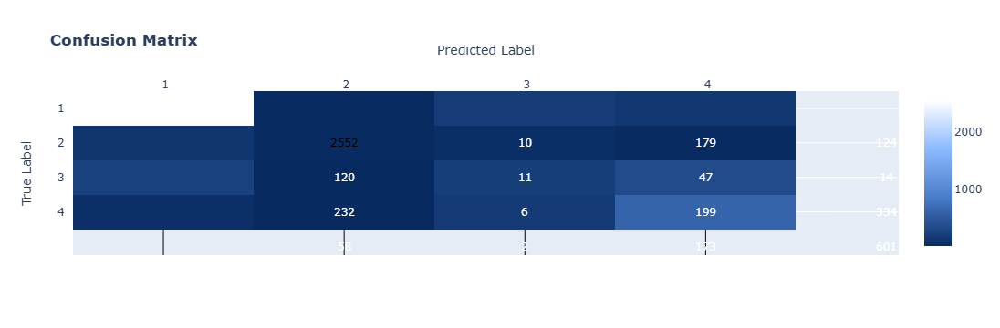

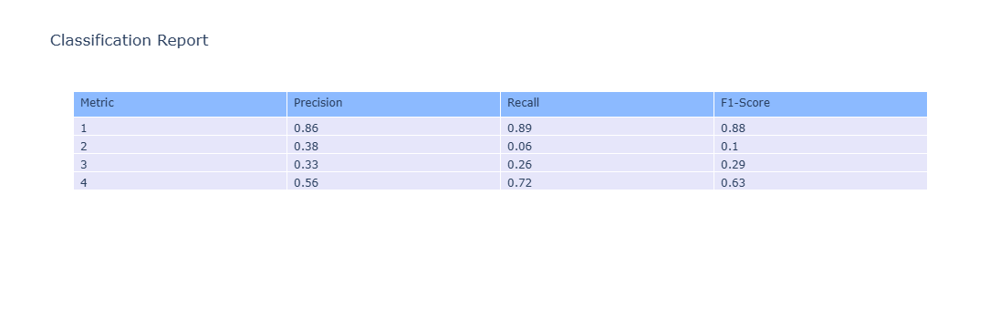

In [6]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, classification_report
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
import plotly.figure_factory as ff
import plotly.graph_objects as go
import numpy as np

df = pd.read_csv('selected_features_ANOVA_8.csv')
variables_to_keep = df[['NUM_ACC', 'NUM_ROU', 'PKM', 'COD_PRV','id_vehicule']]
X = df.drop(['CLASSE_ISR', 'NUM_ACC', 'NUM_ROU', 'PKM', 'COD_PRV','id_vehicule'], axis=1)
y = df['CLASSE_ISR']
X_train, X_test, y_train, y_test, vars_train, vars_test = train_test_split(X, y, variables_to_keep, test_size=0.2, random_state=42)

logreg_model = LogisticRegression(max_iter=1000) 
logreg_model.fit(X_train, y_train)
y_pred = logreg_model.predict(X_test)
accuracy = accuracy_score(y_test, y_pred)
print("Accuracy:", accuracy)
conf_matrix = confusion_matrix(y_test, y_pred)
class_labels = sorted(set(y_test) | set(y_pred))
colors = ['#072b61', '#497cc9', '#8cbaff', '#ffffff']  # Dark to light colors
colorscale = [[i / (len(colors) - 1), colors[i]] for i in range(len(colors))]
fig_cm = ff.create_annotated_heatmap(
    z=conf_matrix,
    colorscale=colorscale,
    x=[f' {label}' for label in class_labels],
    y=[f' {label}' for label in class_labels],
    annotation_text=conf_matrix,
    showscale=True
)

fig_cm.update_layout(
    title_text='<b>Confusion Matrix</b>',
    xaxis_title='Predicted Label',
    yaxis_title='True Label',
    yaxis_autorange='reversed'
)

fig_cm.show()
report = classification_report(y_test, y_pred, target_names=class_labels, output_dict=True)
df_report = pd.DataFrame(report).transpose().round(2)
df_report = df_report.drop('support', axis=1)  # remove support column
df_report = df_report.loc[class_labels]
fig = go.Figure(data=[go.Table(
    header=dict(values=['Metric', 'Precision', 'Recall', 'F1-Score'],
                fill_color='#8cbaff',
                align='left'),
    cells=dict(values=[df_report.index, df_report['precision'], df_report['recall'], df_report['f1-score']],
               fill_color='lavender',
               align='left'))
])
fig.update_layout(title_text='Classification Report')
fig.show()

## SVM

Accuracy: 0.7262977262977263


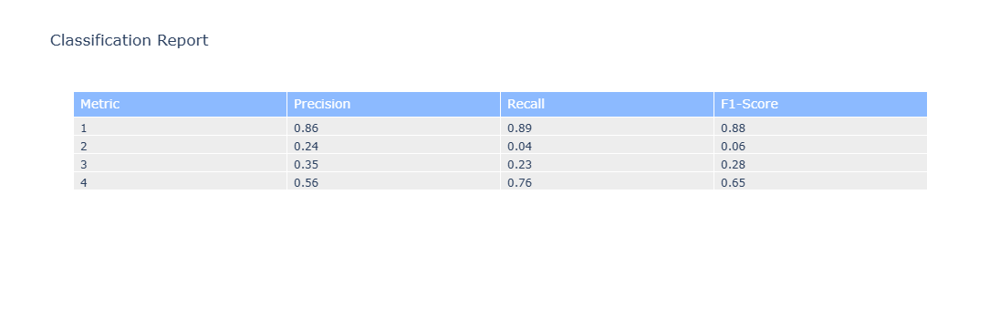

In [8]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
from sklearn.preprocessing import StandardScaler
import plotly.figure_factory as ff
import plotly.graph_objects as go

df = pd.read_csv('selected_features_ANOVA_8.csv')
variables_to_keep = df[['NUM_ACC', 'NUM_ROU', 'PKM', 'COD_PRV','id_vehicule']]
X = df.drop(['CLASSE_ISR', 'NUM_ACC', 'NUM_ROU', 'PKM', 'COD_PRV','id_vehicule'], axis=1)
y = df['CLASSE_ISR']
X_train, X_test, y_train, y_test, vars_train, vars_test = train_test_split(X, y, variables_to_keep, test_size=0.2, random_state=42)
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

logreg_model = LogisticRegression(max_iter=1000)  
logreg_model.fit(X_train_scaled, y_train)
y_pred = logreg_model.predict(X_test_scaled)
accuracy = accuracy_score(y_test, y_pred)
print("Accuracy:", accuracy)
conf_matrix = confusion_matrix(y_test, y_pred)
class_labels = [str(cls) for cls in sorted(set(y_test) | set(y_pred))]  
colors = ['#072b61', '#497cc9', '#8cbaff', '#ffffff'] 
colorscale = [[i / (len(colors) - 1), colors[i]] for i in range(len(colors))]
fig_cm = ff.create_annotated_heatmap(
    z=conf_matrix,
    colorscale=colorscale,
    x=[f'Predicted {label}' for label in class_labels],
    y=[f'True {label}' for label in class_labels],
    annotation_text=conf_matrix,
    showscale=True
)

report = classification_report(y_test, y_pred, target_names=class_labels, output_dict=True)
df_report = pd.DataFrame(report).transpose().round(2)
df_report = df_report.drop('support', axis=1)  
fig = go.Figure(data=[go.Table(
    header=dict(values=['Metric', 'Precision', 'Recall', 'F1-Score'],
                fill_color='#8cbaff',
                 font=dict(color='white', size=14),
                align='left'),
    cells=dict(values=[df_report.index, df_report['precision'], df_report['recall'], df_report['f1-score']],
               fill_color='#ededed',
               align='left'))
])
fig.update_layout(title_text='Classification Report')
fig.show()


## Ensemble learning 

Epoch 1/50
583/583 ━━━━━━━━━━━━━━━━━━━━ 15s 4ms/step - accuracy: 0.5703 - loss: 0.9658
Epoch 2/50
583/583 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - accuracy: 0.7142 - loss: 0.6152
Epoch 3/50
583/583 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - accuracy: 0.7311 - loss: 0.5735
Epoch 4/50
583/583 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - accuracy: 0.7408 - loss: 0.5522
Epoch 5/50
583/583 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - accuracy: 0.7427 - loss: 0.5510
Epoch 6/50
583/583 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - accuracy: 0.7497 - loss: 0.5420
Epoch 7/50
583/583 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - accuracy: 0.7562 - loss: 0.5336
Epoch 8/50
583/583 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - accuracy: 0.7502 - loss: 0.5422
Epoch 9/50
583/583 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - accuracy: 0.7521 - loss: 0.5377
Epoch 10/50
583/583 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - accuracy: 0.7597 - loss: 0.5192
Epoch 11/50
583/583 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - accuracy: 0.7603 - loss: 0.5215
Epoch 12/50
583/583 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/ste

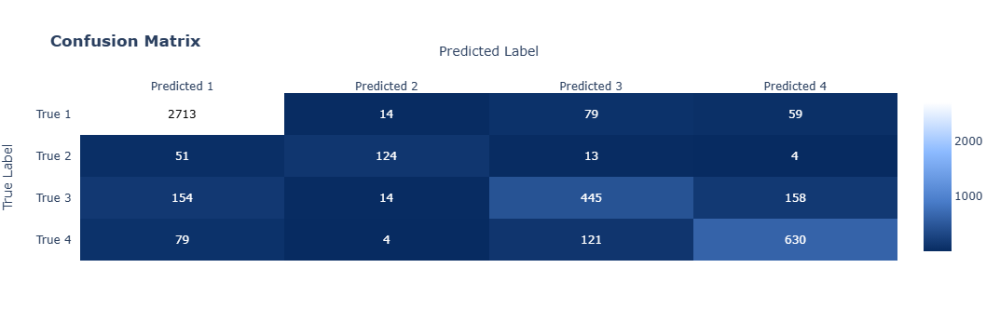

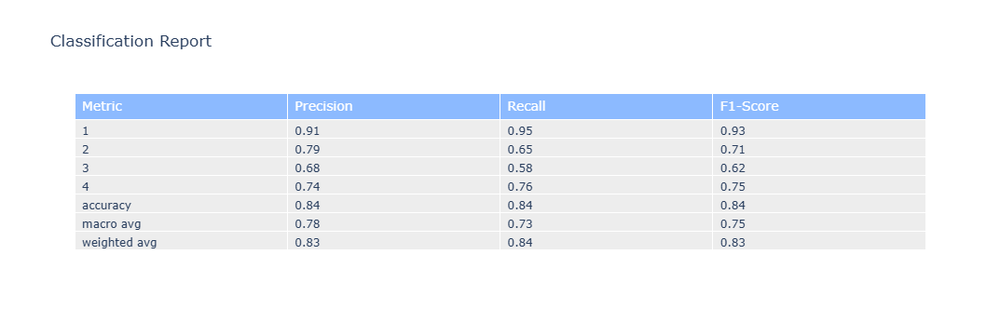

In [5]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import LabelEncoder
from sklearn.ensemble import RandomForestClassifier
from sklearn.neighbors import KNeighborsClassifier
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Input
import numpy as np
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
import plotly.figure_factory as ff
import plotly.graph_objects as go
from sklearn.linear_model import LogisticRegression

def load_and_prepare_data(file_path):
    df = pd.read_csv(file_path)
    variables_to_keep = df[['NUM_ACC', 'NUM_ROU', 'PKM', 'COD_PRV', 'id_vehicule']]
    X = df.drop(['CLASSE_ISR', 'NUM_ACC', 'NUM_ROU', 'PKM', 'COD_PRV', 'id_vehicule'], axis=1)
    y = df['CLASSE_ISR']
    
    le = LabelEncoder()
    y_encoded = le.fit_transform(y)
    
    X_train, X_test, y_train, y_test, vars_train, vars_test = train_test_split(X, y_encoded, variables_to_keep, test_size=0.2, random_state=42)
    
    scaler = StandardScaler()
    X_train_scaled = scaler.fit_transform(X_train)
    X_test_scaled = scaler.transform(X_test)
    
    return X_train, X_test, y_train, y_test, X_train_scaled, X_test_scaled, vars_test, le, X.columns

file_path = 'selected_features_ANOVA_8.csv'
X_train, X_test, y_train, y_test, X_train_scaled, X_test_scaled, vars_test, le, feature_names = load_and_prepare_data(file_path)

# Part 2: Train Individual Models
def train_random_forest(X_train, y_train):
    rf_classifier = RandomForestClassifier(n_estimators=100, random_state=42)
    rf_classifier.fit(X_train, y_train)
    return rf_classifier

rf_classifier = train_random_forest(X_train, y_train)

def train_knn(X_train, y_train):
    knn = KNeighborsClassifier(n_neighbors=5)
    knn.fit(X_train, y_train)
    return knn

knn = train_knn(X_train, y_train)

def create_ann(input_shape, n_classes):
    model = Sequential([
        Input(shape=(input_shape,)),
        Dense(64, activation='relu'),
        Dense(32, activation='relu'),
        Dense(n_classes, activation='softmax')
    ])
    model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])
    return model

def train_ann(X_train_scaled, y_train, input_shape, n_classes):
    model = create_ann(input_shape, n_classes)
    model.fit(X_train_scaled, y_train, epochs=50, batch_size=32, verbose=1)
    return model

input_shape = X_train_scaled.shape[1]
n_classes = len(np.unique(y_train))

ann_model = train_ann(X_train_scaled, y_train, input_shape, n_classes)
def combine_predictions(rf_classifier, knn, ann_model, X_test_scaled, X_test):
    rf_pred = rf_classifier.predict(X_test)
    knn_pred = knn.predict(X_test)
    ann_pred = np.argmax(ann_model.predict(X_test_scaled), axis=1)

    combined_pred = np.array([np.argmax(np.bincount([rf, knn, ann])) for rf, knn, ann in zip(rf_pred, knn_pred, ann_pred)])
    
    return combined_pred

combined_pred = combine_predictions(rf_classifier, knn, ann_model, X_test_scaled, X_test)

def evaluate_and_save(combined_pred, y_test, vars_test, X_test, le, file_path):
    X_test_with_predictions = X_test.copy()
    X_test_with_predictions['Predicted_CLASSE_ISR'] = le.inverse_transform(combined_pred)
    
    X_test_with_predictions = X_test_with_predictions.reset_index(drop=True)
    vars_test = vars_test.reset_index(drop=True)
    X_test_with_predictions = pd.concat([X_test_with_predictions, vars_test], axis=1)
    
    X_test_with_predictions.to_csv(file_path, index=False)
    
    accuracy = accuracy_score(y_test, combined_pred)
    print("Accuracy:", accuracy)
    
    conf_matrix = confusion_matrix(y_test, combined_pred)
    class_labels = le.inverse_transform(sorted(set(y_test) | set(combined_pred)))
    
    report = classification_report(y_test, combined_pred, target_names=class_labels, output_dict=True)
    df_report = pd.DataFrame(report).transpose().round(2)
    df_report = df_report.drop('support', axis=1)
    
    print(df_report)
    
    colors = ['#072b61', '#497cc9', '#8cbaff', '#ffffff']
    colorscale = [[i / (len(colors) - 1), colors[i]] for i in range(len(colors))]
    
    fig_cm = ff.create_annotated_heatmap(
        z=conf_matrix,
        colorscale=colorscale,
        x=[f'Predicted {label}' for label in class_labels],
        y=[f'True {label}' for label in class_labels],
        annotation_text=conf_matrix,
        showscale=True
    )
    
    fig_cm.update_layout(
        title_text='<b>Confusion Matrix</b>',
        xaxis_title='Predicted Label',
        yaxis_title='True Label',
        yaxis_autorange='reversed'
    )
    
    fig_cm.show()
    
    fig = go.Figure(data=[go.Table(
        header=dict(values=['Metric', 'Precision', 'Recall', 'F1-Score'],
                    fill_color='#8cbaff',
                    font=dict(color='white', size=14),
                    align='left'),
        cells=dict(values=[df_report.index, df_report['precision'], df_report['recall'], df_report['f1-score']],
                   fill_color='#ededed',
                   align='left'))
    ])
    
    fig.update_layout(title_text='Classification Report')
    fig.show()

evaluate_and_save(combined_pred, y_test, vars_test, X_test, le, 'Ensemble_CLASSISR_2105.csv')


## Comparaison between individual training and ensemble learning

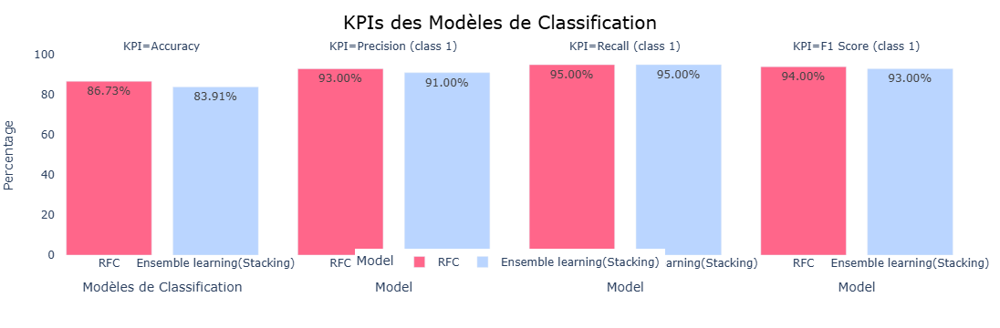

In [3]:
import plotly.express as px
import pandas as pd
data = {
    'Model': ['RFC', 'Ensemble learning(Stacking)'] * 4,
    'KPI': ['Accuracy'] * 2 + ['Precision (class 1)'] * 2 + ['Recall (class 1)'] * 2 + ['F1 Score (class 1)'] * 2,
    'Value': [86.73,83.91 , 93, 91, 95, 95, 94, 93]
}

df = pd.DataFrame(data)

colors = ['#ff668a', 'rgba(140, 186, 255, 0.6)', '#fff1a8']
fig = px.bar(
    df, x='Model', y='Value', color='Model', facet_col='KPI',
    color_discrete_sequence=colors,
    text='Value'
)
fig.update_layout(
    title={
        'text': "KPIs des Modèles de Classification",
        'y':0.95,
        'x':0.5,
        'xanchor': 'center',
        'yanchor': 'top',
        'font': dict(size=20, family='Verdana', color='black')
    },
    xaxis_title=' Modèles de Classification',
    yaxis_title='Percentage',
    margin=dict(l=40, r=40, t=60, b=80),
    legend_title_text='Model',
    legend=dict(
        orientation="h",
        yanchor="bottom",
        y=-0.1,
        xanchor="center",
        x=0.5
    ),
    plot_bgcolor='white'
)
fig.update_traces(texttemplate='%{text:.2f}%', textposition='auto')
fig.write_image("ENS_VS_RFC.png", scale=2) 
fig.show()

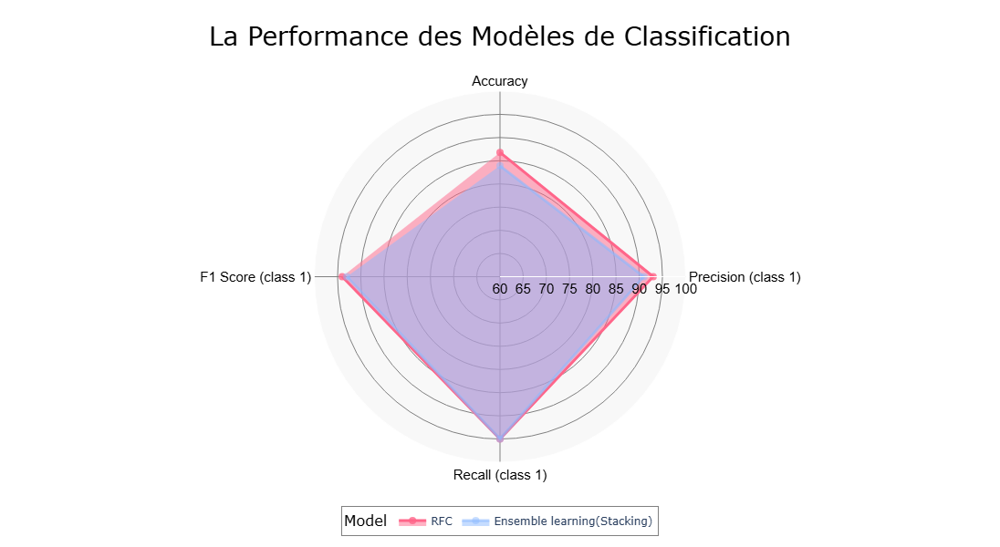

In [1]:
import plotly.graph_objects as go

labels = ['Accuracy', 'Precision (class 1)', 'Recall (class 1)', 'F1 Score (class 1)']
models = {
    'RFC': [86.80, 93, 95, 94],
    'Ensemble learning(Stacking)': [83.91, 91, 95, 93]
  
}

colors = [ '#ff668a', 'rgba(140, 186, 255, 0.6)', '#fff1a8']  

fig = go.Figure()

for i, (model, values) in enumerate(models.items()):
    fig.add_trace(go.Scatterpolar(
        r=values,
        theta=labels,
        fill='toself',
        name=model,
        line=dict(color=colors[i], width=3),  
        marker=dict(color=colors[i], size=8, symbol='circle', opacity=0.8)  
    ))

fig.update_layout(
    polar=dict(
        bgcolor='#f8f8f8',
        radialaxis=dict(
            visible=True,
            range=[60, 100],  
            tickfont=dict(size=15, family='Arial, sans-serif', color='black'),  
            gridcolor='gray',  
            gridwidth=1 
        ),
        angularaxis=dict(
            rotation=90,  
            direction='clockwise',
            tickfont=dict(size=15, family='Arial, sans-serif', color='black'),  
            gridcolor='gray',  
            gridwidth=1  
        )
    ),
    title={
        'text': "La Performance des Modèles de Classification ",
        'y':0.95,
        'x':0.5,
        'xanchor': 'center',
        'yanchor': 'top',
        'font': dict(size=28, family='Verdana', color='black') 
    },
    legend_title_text='Model',
    legend_title_font=dict(size=16, color='black'),
    legend=dict(
        orientation="h", 
        yanchor="bottom",
        y=-0.2,
        xanchor="center",
        x=0.5,
        bgcolor='rgba(255, 255, 255, 0.8)',  
        bordercolor='gray',
        borderwidth=1
    ),
    width=800, 
    height=600  
)

fig.write_image("ENS_VS_RFC.png", scale=2) 
fig.show()

## Comparaison between classification models

In [10]:
import plotly.graph_objects as go
color = ['#8cbaff', '#ededed']
table_data = [
     ["Classification models", "Accuracy ", " Precision (class 1)","Recall (class 1)","F1 Score (class 1)"],
    ["RFC","KNN", "ANN" ],
    ["86.73%", "79.77%", " 76.02%"],
    ["93%", "88%", "85%"],
    ["95%", "92%", "91%"],
    ["94%", "90%", "88%"]
]
table_trace = go.Table(
    header=dict(values=table_data[0],
                fill_color=color[0],
                font=dict(color='white', size=14),
                align='center'),
    cells=dict(values=table_data[1:],
               fill_color=color[1],
               font=dict(color='black', size=12),
               align='center')
)
layout = go.Layout(
    title="KPIS  Results",
    margin=dict(l=20, r=20, t=60, b=20)
)

fig = go.Figure(data=[table_trace], layout=layout)
fig.show()


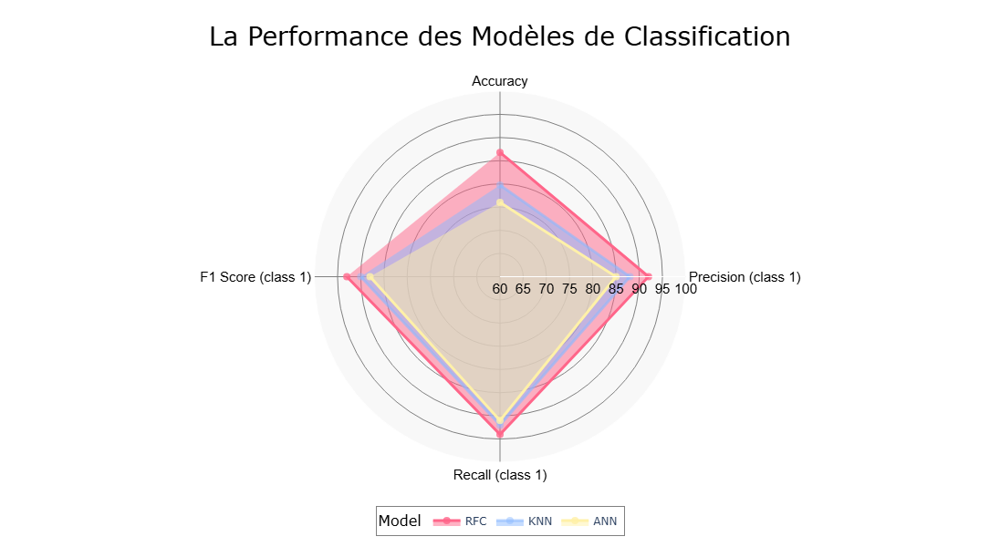

In [8]:
import plotly.graph_objects as go

labels = ['Accuracy', 'Precision (class 1)', 'Recall (class 1)', 'F1 Score (class 1)']
models = {
    'RFC': [86.80, 92, 94, 93],
    'KNN': [79.77, 88, 92, 90],
    'ANN': [76.02, 85, 91, 88]
}

colors = [ '#ff668a', 'rgba(140, 186, 255, 0.6)', '#fff1a8']  

fig = go.Figure()

for i, (model, values) in enumerate(models.items()):
    fig.add_trace(go.Scatterpolar(
        r=values,
        theta=labels,
        fill='toself',
        name=model,
        line=dict(color=colors[i], width=3),  
        marker=dict(color=colors[i], size=8, symbol='circle', opacity=0.8)  
    ))

fig.update_layout(
    polar=dict(
        bgcolor='#f8f8f8',
        radialaxis=dict(
            visible=True,
            range=[60, 100],  
            tickfont=dict(size=15, family='Arial, sans-serif', color='black'),  
            gridcolor='gray',  
            gridwidth=1 
        ),
        angularaxis=dict(
            rotation=90,  
            direction='clockwise',
            tickfont=dict(size=15, family='Arial, sans-serif', color='black'),  
            gridcolor='gray',  
            gridwidth=1  
        )
    ),
    title={
        'text': "La Performance des Modèles de Classification ",
        'y':0.95,
        'x':0.5,
        'xanchor': 'center',
        'yanchor': 'top',
        'font': dict(size=28, family='Verdana', color='black') 
    },
    legend_title_text='Model',
    legend_title_font=dict(size=16, color='black'),
    legend=dict(
        orientation="h", 
        yanchor="bottom",
        y=-0.2,
        xanchor="center",
        x=0.5,
        bgcolor='rgba(255, 255, 255, 0.8)',  
        bordercolor='gray',
        borderwidth=1
    ),
    width=800, 
    height=600  
)

fig.write_image("rfannknn.png", scale=2) 
fig.show()


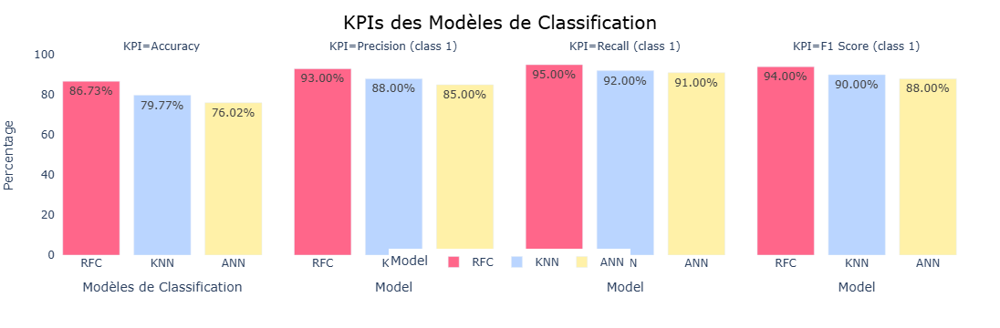

In [7]:
import plotly.express as px
import pandas as pd

data = {
    'Model': ['RFC', 'KNN', 'ANN'] * 4,
    'KPI': ['Accuracy'] * 3 + ['Precision (class 1)'] * 3 + ['Recall (class 1)'] * 3 + ['F1 Score (class 1)'] * 3,
    'Value': [86.73, 79.77, 76.02, 93, 88, 85, 95, 92, 91, 94, 90, 88]
}

df = pd.DataFrame(data)

colors = ['#ff668a', 'rgba(140, 186, 255, 0.6)', '#fff1a8']

fig = px.bar(
    df, x='Model', y='Value', color='Model', facet_col='KPI',
    color_discrete_sequence=colors,
    text='Value'
)

fig.update_layout(
    title={
        'text': "KPIs des Modèles de Classification",
        'y': 0.95,
        'x': 0.5,
        'xanchor': 'center',
        'yanchor': 'top',
        'font': dict(size=20, family='Verdana', color='black')
    },
    xaxis_title='Modèles de Classification',
    yaxis_title='Percentage',
    margin=dict(l=40, r=40, t=60, b=80),
    legend_title_text='Model',
    legend=dict(
        orientation="h",
        yanchor="bottom",
        y=-0.1,
        xanchor="center",
        x=0.5
    ),
    plot_bgcolor='white'
)

fig.update_traces(texttemplate='%{text:.2f}%', textposition='auto')

fig.write_image("rfannknn1.png", scale=2)
fig.show()



## training /testing time 

In [15]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, classification_report
import time

df = pd.read_csv('selected_features_ANOVA_8.csv')
variables_to_keep = df[['NUM_ACC', 'NUM_ROU', 'PKM', 'COD_PRV','id_vehicule']]
X = df.drop(['CLASSE_ISR', 'NUM_ACC', 'NUM_ROU', 'PKM', 'COD_PRV','id_vehicule'], axis=1)
y = df['CLASSE_ISR']
X_train, X_test, y_train, y_test, vars_train, vars_test = train_test_split(X, y, variables_to_keep, test_size=0.2, random_state=42)

rf_classifier = RandomForestClassifier(n_estimators=100, random_state=42)
start_train_time = time.time()
rf_classifier.fit(X_train, y_train)
end_train_time = time.time()
training_time = end_train_time - start_train_time
print("Training Time:", training_time, "seconds")
start_test_time = time.time()
y_pred = rf_classifier.predict(X_test)
end_test_time = time.time()
testing_time = end_test_time - start_test_time
print("Testing Time:", testing_time, "seconds")
accuracy = accuracy_score(y_test, y_pred)
print("Accuracy:", accuracy)
X_test_with_predictions = X_test.copy()
X_test_with_predictions['Predicted_CLASSE_ISR'] = y_pred


Training Time: 4.217880725860596 seconds
Testing Time: 0.2432572841644287 seconds
Accuracy: 0.854997854997855


In [17]:
import pandas as pd
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Input
from sklearn.model_selection import train_test_split
from tensorflow.keras.utils import to_categorical
import time

df = pd.read_csv('selected_features_ANOVA_8.csv')
variables_to_keep = df[['NUM_ACC', 'NUM_ROU', 'PKM', 'COD_PRV','id_vehicule']]
X = df.drop(['CLASSE_ISR', 'NUM_ACC', 'NUM_ROU', 'PKM', 'COD_PRV','id_vehicule'], axis=1)
y = df['CLASSE_ISR']
y_encoded = to_categorical(y)
X_train, X_test, y_train, y_test, vars_train, vars_test = train_test_split(X, y_encoded, variables_to_keep, test_size=0.2, random_state=42)

model = Sequential([
    Input(shape=(X_train.shape[1],)),
    Dense(64, activation='relu'),
    Dense(32, activation='relu'),
    Dense(y_train.shape[1], activation='softmax')
])

model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])
start_time = time.time()
history = model.fit(X_train, y_train, epochs=60, batch_size=32, verbose=1, validation_split=0.1)
training_time = time.time() - start_time

print(f"Training time: {training_time:.2f} seconds")
start_time = time.time()
loss, accuracy = model.evaluate(X_test, y_test, verbose=1)
testing_time = time.time() - start_time

print(f"Testing time: {testing_time:.2f} seconds")

print(f'Accuracy: {accuracy*100:.2f}%')


Epoch 1/60
525/525 ━━━━━━━━━━━━━━━━━━━━ 8s 7ms/step - accuracy: 0.5430 - loss: 70.1040 - val_accuracy: 0.6665 - val_loss: 17.9670
Epoch 2/60
525/525 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step - accuracy: 0.6394 - loss: 11.9221 - val_accuracy: 0.6938 - val_loss: 8.3985
Epoch 3/60
525/525 ━━━━━━━━━━━━━━━━━━━━ 5s 5ms/step - accuracy: 0.6529 - loss: 12.9030 - val_accuracy: 0.6520 - val_loss: 15.0119
Epoch 4/60
525/525 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - accuracy: 0.6693 - loss: 10.9537 - val_accuracy: 0.6976 - val_loss: 9.0153
Epoch 5/60
525/525 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - accuracy: 0.6684 - loss: 10.5070 - val_accuracy: 0.6794 - val_loss: 6.4274
Epoch 6/60
525/525 ━━━━━━━━━━━━━━━━━━━━ 3s 5ms/step - accuracy: 0.6753 - loss: 9.8838 - val_accuracy: 0.7046 - val_loss: 7.6231
Epoch 7/60
525/525 ━━━━━━━━━━━━━━━━━━━━ 6s 7ms/step - accuracy: 0.6778 - loss: 8.5871 - val_accuracy: 0.6810 - val_loss: 4.2359
Epoch 8/60
525/525 ━━━━━━━━━━━━━━━━━━━━ 4s 6ms/step - accuracy: 0.6711 - loss: 9.4533 - val_accur

In [19]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
import time

df = pd.read_csv('selected_features_ANOVA_8.csv')
variables_to_keep = df[['NUM_ACC', 'NUM_ROU', 'PKM', 'COD_PRV','id_vehicule']]
X = df.drop(['CLASSE_ISR', 'NUM_ACC', 'NUM_ROU', 'PKM', 'COD_PRV','id_vehicule'], axis=1)
y = df['CLASSE_ISR']
X_train, X_test, y_train, y_test, vars_train, vars_test = train_test_split(X, y, variables_to_keep, test_size=0.2, random_state=42)
knn = KNeighborsClassifier(n_neighbors=5)
start_time = time.time()
knn.fit(X_train, y_train)
training_time = time.time() - start_time
print("Training Time:", training_time, "seconds")
start_time = time.time()
y_pred = knn.predict(X_test)
testing_time = time.time() - start_time
print("Testing Time:", testing_time, "seconds")
accuracy = accuracy_score(y_test, y_pred)
print("Accuracy:", accuracy)

X_test_with_predictions = X_test.copy()
X_test_with_predictions['Predicted_CLASSE_ISR'] = y_pred


Training Time: 0.4108603000640869 seconds
Testing Time: 0.9856617450714111 seconds
Accuracy: 0.7831402831402832


In [1]:
import plotly.graph_objects as go
color = ['#8cbaff', '#ededed']
table_data = [
     ["Classification models", "Training", " Testing"],
    ["RFC","KNN", "ANN" ],
    ["4.2178s", "0.4108s", "216.61s"],
    ["0.2432s", "0.9856s", "0.63s"],


]
table_trace = go.Table(
    header=dict(values=table_data[0],
                fill_color=color[0],
                font=dict(color='white', size=14),
                align='center'),
    cells=dict(values=table_data[1:],
               fill_color=color[1],
               font=dict(color='black', size=12),
               align='center')
)
layout = go.Layout(
    title="La duree de testing et training des algorithms de classification",
    margin=dict(l=20, r=20, t=60, b=20)
)

fig = go.Figure(data=[table_trace], layout=layout)
fig.show()

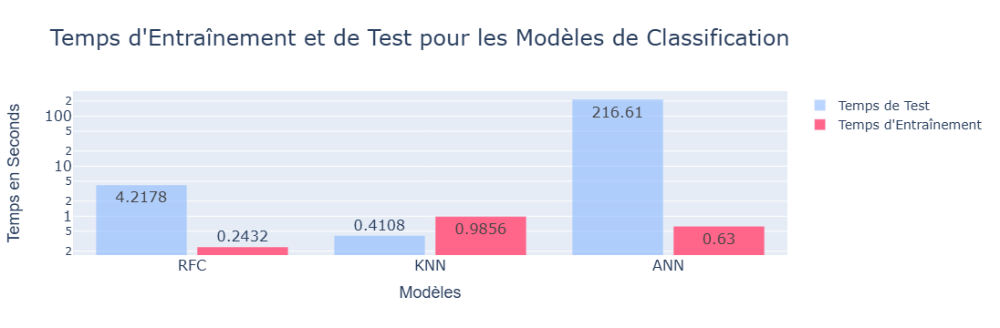

In [11]:
import plotly.graph_objects as go
models = ["RFC", "KNN", "ANN"]
training_times = [4.2178, 0.4108, 216.61]  
testing_times = [0.2432, 0.9856, 0.63]  
fig = go.Figure()
fig.add_trace(go.Bar(
    x=models,
    y=training_times,
    name='Temps de Test',
    marker_color='rgba(140, 186, 255, 0.6)',  
    text=training_times,
    textposition='auto',
    textfont=dict(size=16)  
))
fig.add_trace(go.Bar(
    x=models,
    y=testing_times,
    name="Temps d'Entraînement",
    marker_color='#ff668a',  
    text=testing_times,
    textposition='auto',
    textfont=dict(size=16)  
))
fig.update_layout(
    title="Temps d'Entraînement et de Test pour les Modèles de Classification",
    title_font_size=24, 
    xaxis=dict(
        title='Modèles',
        title_font=dict(size=18, family='Arial, sans-serif'),
        tickfont=dict(size=16) 
    ),
    yaxis=dict(
        title='Temps en Seconds',
        title_font=dict(size=18, family='Arial, sans-serif'), 
        tickfont=dict(size=16), 
        type='log'  
    ),
    barmode='group',
    bargap=0.15, 
    bargroupgap=0.1,  
    legend_title_font_size=16,  
    legend_font_size=14  
)
fig.write_image("train_test.png", scale=2) 
fig.show()



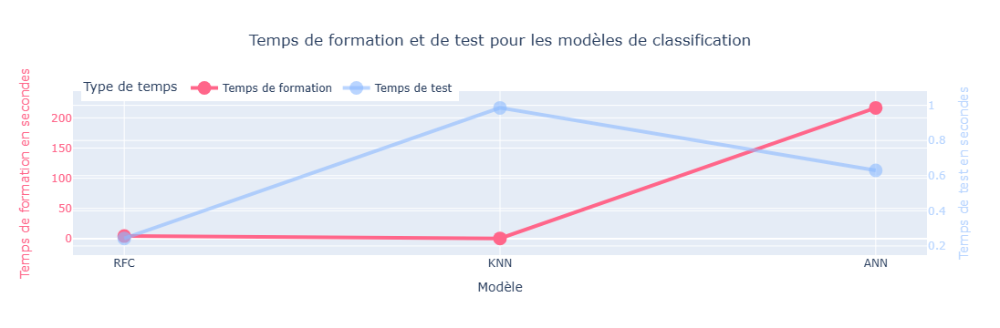

In [5]:
import plotly.graph_objects as go
models = ["RFC", "KNN", "ANN"]
training_times = [4.2178, 0.4108, 216.61]  
testing_times = [0.2432, 0.9856, 0.63]  
fig = go.Figure()
fig.update_layout(
    title="Temps de formation et de test pour les modèles de classification", 
    title_x=0.5, 
    xaxis_title="Modèle",
    yaxis=dict(
        title="Temps de formation en secondes",
        titlefont=dict(color="#ff668a"),
        tickfont=dict(color="#ff668a")
    ),
    yaxis2=dict(
        title="Temps de test en secondes",
        titlefont=dict(color="rgba(140, 186, 255, 0.6)"),
        tickfont=dict(color="rgba(140, 186, 255, 0.6)"),
        anchor="x",
        overlaying="y",
        side="right"
    ),
    legend_title_text='Type de temps', 
    legend=dict(
        x=0.01,  
        y=1.1, 
        orientation="h"  
        
    )
)
fig.add_trace(go.Scatter(
    x=models,
    y=training_times,
    name='Temps de formation',
    mode='lines+markers',
    line=dict(color='#ff668a', width=4),
    marker=dict(size=15)
))

# Add line for testing times
fig.add_trace(go.Scatter(
    x=models,
    y=testing_times,
    name='Temps de test',
    mode='lines+markers',
    line=dict(color='rgba(140, 186, 255, 0.6)', width=4),
    marker=dict(size=15),
    yaxis='y2'
))

fig.show()
fig.write_image("train_test1.png", scale=2) 



## AUC ROC

In [4]:
import plotly.graph_objects as go

color = ['#8cbaff', '#ededed']

rf_auc_scores = [0.9779, 0.9907, 0.9379, 0.9634]
knn_auc_scores = [0.9521, 0.9417, 0.8669, 0.9135]
ann_auc_scores = [0.9202, 0.5625, 0.7461, 0.8156]

classes = ['1', '2', '3', '4']

table_data = [classes, rf_auc_scores, knn_auc_scores, ann_auc_scores]

fig = go.Figure(data=[go.Table(
    header=dict(values=['Class', 'Random Forest AUC', 'KNN AUC', 'ANN AUC'],
                fill_color=color[0],
                font=dict(color='white', size=14),
                align='center'),
    cells=dict(values=table_data,
               fill_color=color[1],
               font=dict(color='black', size=12),
               align='center')
)])

fig.update_layout(title_text='AUC Scores pour Random Forest, KNN, and ANN Models')
fig.show()

## AUC , ROC

Random Forest AUC Score for Class 3: 0.95
KNN AUC Score for Class 3: 0.87
ANN AUC Score for Class 3: 0.81


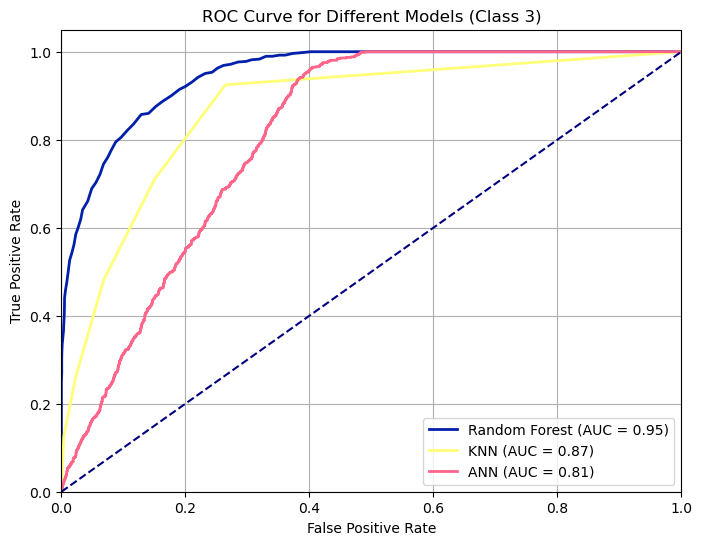

In [13]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.neural_network import MLPClassifier
from sklearn.metrics import roc_auc_score, roc_curve, auc
import matplotlib.pyplot as plt
import numpy as np

def compute_auc(classifier, X_test, y_test):
    """Compute the AUC score for a single class."""
    probs = classifier.predict_proba(X_test)
    class_index = 2  
    auc_score = roc_auc_score(y_test == class_index + 1, probs[:, class_index])
    return auc_score

def plot_roc_curve(classifiers, X_test, y_test):
    plt.figure(figsize=(8, 6))
    colors = ['#001fab', '#ffff78', '#ff668a']
    class_index = 2  
    
    for idx, (model, classifier) in enumerate(classifiers.items()):
        if hasattr(classifier, "predict_proba"):  
            y_score = classifier.predict_proba(X_test)
            fpr, tpr, _ = roc_curve(y_test == class_index + 1, y_score[:, class_index])
            roc_auc = auc(fpr, tpr)
            plt.plot(fpr, tpr, color=colors[idx % len(colors)], lw=2,
                     label=f'{model} (AUC = {roc_auc:.2f})')

    plt.plot([0, 1], [0, 1], color='navy', linestyle='--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('ROC Curve for Different Models (Class 3)')
    plt.legend(loc='lower right')
    plt.grid(True)
    plt.show()

df = pd.read_csv('selected_features_ANOVA_8.csv')
variables_to_keep = df[['NUM_ACC', 'NUM_ROU', 'PKM', 'COD_PRV', 'id_vehicule']]
X = df.drop(['CLASSE_ISR', 'NUM_ACC', 'NUM_ROU', 'PKM', 'COD_PRV', 'id_vehicule'], axis=1)
y = df['CLASSE_ISR']
X_train, X_test, y_train, y_test, vars_train, vars_test = train_test_split(
    X, y, variables_to_keep, test_size=0.2, random_state=42)
rf_classifier = RandomForestClassifier(n_estimators=100, random_state=42)
knn_classifier = KNeighborsClassifier(n_neighbors=5)
ann_classifier = MLPClassifier(hidden_layer_sizes=(100,), activation='relu', solver='adam', random_state=42)

rf_classifier.fit(X_train, y_train)
knn_classifier.fit(X_train, y_train)
ann_classifier.fit(X_train, y_train)
classifiers = {'Random Forest': rf_classifier, 'KNN': knn_classifier, 'ANN': ann_classifier}
auc_scores = {model: compute_auc(classifier, X_test, y_test) for model, classifier in classifiers.items()}

for model, score in auc_scores.items():
    print(f"{model} AUC Score for Class 3: {score:.2f}")
plot_roc_curve(classifiers, X_test, y_test)


Random Forest AUC Score: 0.97
KNN AUC Score: 0.92
ANN AUC Score: 0.85


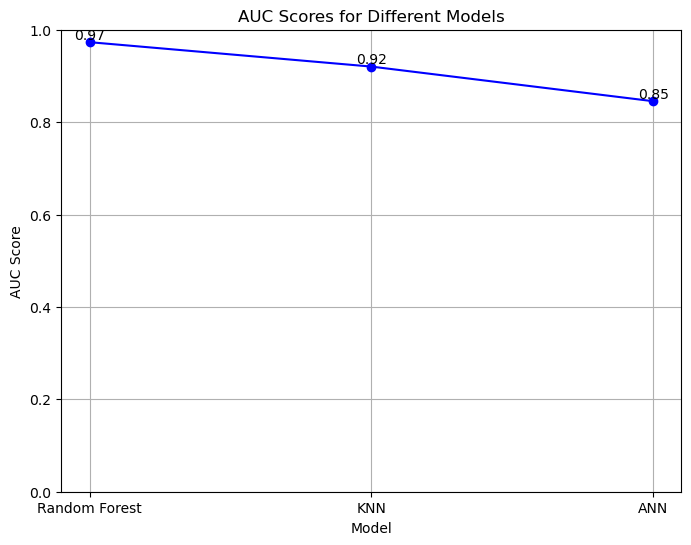

In [18]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.neural_network import MLPClassifier
from sklearn.metrics import roc_auc_score
import matplotlib.pyplot as plt

def compute_auc(classifier, X_test, y_test):
    """Compute the AUC score for a given classifier."""
    probs = classifier.predict_proba(X_test)
    return roc_auc_score(y_test, probs, average='macro', multi_class='ovr')

df = pd.read_csv('selected_features_ANOVA_8.csv')
variables_to_keep = df[['NUM_ACC', 'NUM_ROU', 'PKM', 'COD_PRV','id_vehicule']]
X = df.drop(['CLASSE_ISR', 'NUM_ACC', 'NUM_ROU', 'PKM', 'COD_PRV','id_vehicule'], axis=1)
y = df['CLASSE_ISR']
X_train, X_test, y_train, y_test, vars_train, vars_test = train_test_split(X, y, variables_to_keep, test_size=0.2, random_state=42)
rf_classifier = RandomForestClassifier(n_estimators=100, random_state=42)
knn_classifier = KNeighborsClassifier(n_neighbors=5)
ann_classifier = MLPClassifier(hidden_layer_sizes=(100,), activation='relu', solver='adam', random_state=42)
rf_classifier.fit(X_train, y_train)
knn_classifier.fit(X_train, y_train)
ann_classifier.fit(X_train, y_train)
models = ['Random Forest', 'KNN', 'ANN']
classifiers = [rf_classifier, knn_classifier, ann_classifier]
auc_scores = [compute_auc(classifier, X_test, y_test) for classifier in classifiers]
for model, score in zip(models, auc_scores):
    print(f"{model} AUC Score: {score:.2f}")
plt.figure(figsize=(8, 6))
plt.plot(models, auc_scores, marker='o', color='blue', linestyle='-')
for i, auc in enumerate(auc_scores):
    plt.text(i, auc, f'{auc:.2f}', ha='center', va='bottom') 
plt.xlabel('Model')
plt.ylabel('AUC Score')
plt.title('AUC Scores for Different Models')
plt.ylim(0, 1)
plt.grid(True)
plt.show()


Random Forest AUC Scores: [0.9802381514274809, 0.9943191881058911, 0.948315161430432, 0.9693217213063405]
KNN AUC Scores: [0.9540002194854523, 0.9442259740865027, 0.8708004870729986, 0.9117688607734502]
ANN AUC Scores: [0.9273979999630952, 0.7292051174496644, 0.8089911835520528, 0.9154513379891699]


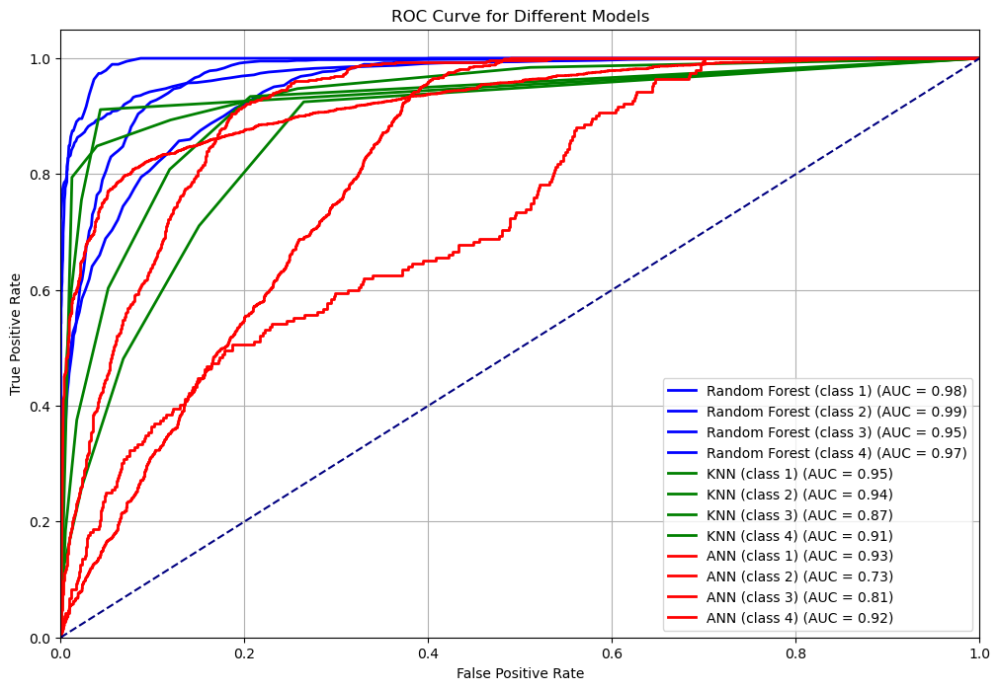

In [20]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.neural_network import MLPClassifier
from sklearn.metrics import roc_auc_score, roc_curve, auc
import matplotlib.pyplot as plt
import numpy as np

def compute_auc(classifier, X_test, y_test):
    """Compute the AUC score for each class."""
    probs = classifier.predict_proba(X_test)
    auc_scores = []
    for i in range(probs.shape[1]):
        auc_score = roc_auc_score(y_test == i + 1, probs[:, i])
        auc_scores.append(auc_score)
    return auc_scores

def plot_roc_curves(classifiers, X_test, y_test):
    plt.figure(figsize=(12, 8))
    colors = ['blue', 'green', 'red', 'cyan', 'magenta', 'yellow']
    for idx, (model, classifier) in enumerate(classifiers.items()):
        if hasattr(classifier, "predict_proba"):  # Check if the classifier supports predict_proba
            y_score = classifier.predict_proba(X_test)
            n_classes = y_score.shape[1]
            for i in range(n_classes):
                fpr, tpr, _ = roc_curve(y_test == i + 1, y_score[:, i])
                roc_auc = auc(fpr, tpr)
                plt.plot(fpr, tpr, color=colors[idx % len(colors)], lw=2,
                         label=f'{model} (class {i+1}) (AUC = {roc_auc:.2f})')

    plt.plot([0, 1], [0, 1], color='navy', linestyle='--')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('ROC Curve for Different Models')
    plt.legend(loc='lower right')
    plt.grid(True)
    plt.show()

# Load your data
df = pd.read_csv('selected_features_ANOVA_8.csv')
variables_to_keep = df[['NUM_ACC', 'NUM_ROU', 'PKM', 'COD_PRV', 'id_vehicule']]
X = df.drop(['CLASSE_ISR', 'NUM_ACC', 'NUM_ROU', 'PKM', 'COD_PRV', 'id_vehicule'], axis=1)
y = df['CLASSE_ISR']

# Split the data
X_train, X_test, y_train, y_test, vars_train, vars_test = train_test_split(
    X, y, variables_to_keep, test_size=0.2, random_state=42)

# Define and fit the classifiers
rf_classifier = RandomForestClassifier(n_estimators=100, random_state=42)
knn_classifier = KNeighborsClassifier(n_neighbors=5)
ann_classifier = MLPClassifier(hidden_layer_sizes=(100,), activation='relu', solver='adam', random_state=42)

rf_classifier.fit(X_train, y_train)
knn_classifier.fit(X_train, y_train)
ann_classifier.fit(X_train, y_train)

# Store the classifiers and their names in a dictionary
classifiers = {'Random Forest': rf_classifier, 'KNN': knn_classifier, 'ANN': ann_classifier}

# Compute AUC scores
auc_scores = {model: compute_auc(classifier, X_test, y_test) for model, classifier in classifiers.items()}

# Print AUC scores
for model, scores in auc_scores.items():
    print(f"{model} AUC Scores: {scores}")

# Plot ROC curves
plot_roc_curves(classifiers, X_test, y_test)
